In [1]:
import torch
from utils import load_ckpt, visualize_depth
from collections import defaultdict
import matplotlib.pyplot as plt
import time

from models.rendering import *
from models.nerf import *

import metrics

from datasets import dataset_dict

torch.backends.cudnn.benchmark = True

img_wh = (200, 200)

In [2]:
# Change to your settings...
############################
encode_appearance = False
N_a = 48
encode_transient = False
N_tau = 16
beta_min = 0.1
ckpt_path = 'ckpts/exp/epoch=19.ckpt'

N_samples = 64
N_importance = 64
use_disp = False
chunk = 1024*32
#############################

embedding_xyz = PosEmbedding(9, 10)
embedding_dir = PosEmbedding(3, 4)
embeddings = {'xyz': embedding_xyz, 'dir': embedding_dir}
if encode_appearance:
    embedding_a = torch.nn.Embedding(100, N_a).cuda()
    load_ckpt(embedding_a, ckpt_path, model_name='embedding_a')
    embeddings['a'] = embedding_a
if encode_transient:
    embedding_t = torch.nn.Embedding(100, N_tau).cuda()
    load_ckpt(embedding_t, ckpt_path, model_name='embedding_t')
    embeddings['t'] = embedding_t
    

nerf_coarse = NeRF('coarse').cuda()
nerf_fine = NeRF('fine',
                 encode_appearance=encode_appearance,
                 in_channels_a=N_a,
                 encode_transient=encode_transient,
                 in_channels_t=N_tau,
                 beta_min=beta_min).cuda()

load_ckpt(nerf_coarse, ckpt_path, model_name='nerf_coarse')
load_ckpt(nerf_fine, ckpt_path, model_name='nerf_fine')

models = {'coarse': nerf_coarse, 'fine': nerf_fine}

In [3]:
@torch.no_grad()
def f(rays, ts):
    """Do batched inference on rays using chunk."""
    B = rays.shape[0]
    results = defaultdict(list)
    for i in range(0, B, chunk):
        rendered_ray_chunks = \
            render_rays(models,
                        embeddings,
                        rays[i:i+chunk],
                        ts[i:i+chunk],
                        N_samples,
                        use_disp,
                        0,
                        0,
                        N_importance,
                        chunk,
                        dataset.white_back,
                        test_time=True)

        for k, v in rendered_ray_chunks.items():
            results[k] += [v]

    for k, v in results.items():
        results[k] = torch.cat(v, 0)
    return results

# Test on (perturbed) train images

In [4]:
perturbation = ['color']

dataset = dataset_dict['blender'] \
          ('data/nerf_synthetic/lego/',
           split='test_train',
           perturbation=perturbation,
           img_wh=img_wh)

In [5]:
# sample an image ...
# 0 is unperturbed, others are perturbed
sample = dataset[50]
rays = sample['rays'].cuda()
ts = sample['ts'].cuda()

results = f(rays, ts)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


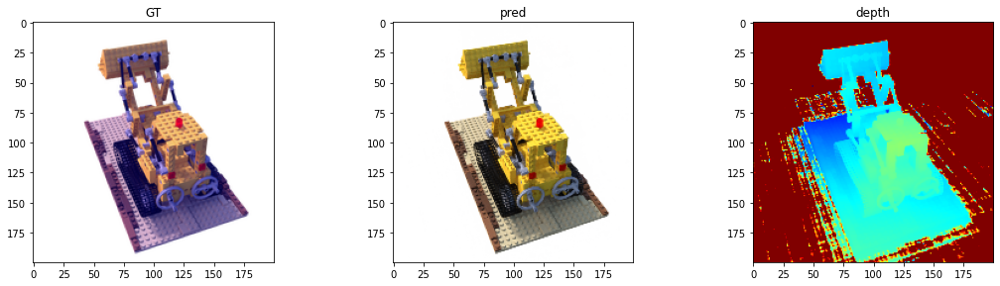

PSNR between GT and pred: 22.420669555664062 



In [6]:
img_gt = sample['rgbs'].view(img_wh[1], img_wh[0], 3)
img_pred = results['rgb_fine'].view(img_wh[1], img_wh[0], 3).cpu().numpy()
depth_pred = results['depth_fine'].view(img_wh[1], img_wh[0])

plt.subplots(figsize=(15, 8))
plt.tight_layout()
plt.subplot(231)
plt.title('GT')
plt.imshow(img_gt)
plt.subplot(232)
plt.title('pred')
plt.imshow(img_pred)
plt.subplot(233)
plt.title('depth')
plt.imshow(visualize_depth(depth_pred).permute(1,2,0))
plt.show()

print('PSNR between GT and pred:', metrics.psnr(img_gt, img_pred).item(), '\n')

# Test on 63th val image (same as the image in the paper Fig 13)

In [9]:
perturbation = ['color']

dataset = dataset_dict['blender'] \
          ('data/nerf_synthetic/lego/',
           split='val',
           perturbation=perturbation,
           img_wh=img_wh)

In [10]:
sample = dataset[63]
rays = sample['rays'].cuda()
ts = sample['ts'].cuda()

results = f(rays, ts)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


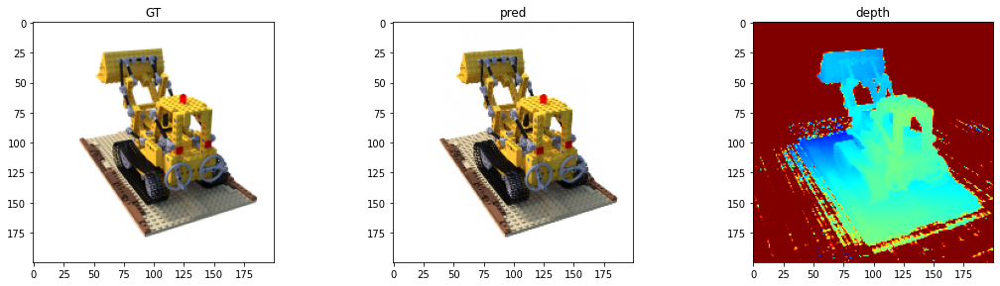

PSNR between GT and pred: 27.797805786132812 



In [11]:
img_gt = sample['rgbs'].view(img_wh[1], img_wh[0], 3)
img_pred = results['rgb_fine'].view(img_wh[1], img_wh[0], 3).cpu().numpy()
depth_pred = results['depth_fine'].view(img_wh[1], img_wh[0])

plt.subplots(figsize=(15, 8))
plt.tight_layout()
plt.subplot(231)
plt.title('GT')
plt.imshow(img_gt)
plt.subplot(232)
plt.title('pred')
plt.imshow(img_pred)
plt.subplot(233)
plt.title('depth')
plt.imshow(visualize_depth(depth_pred).permute(1,2,0))
plt.show()

print('PSNR between GT and pred:', metrics.psnr(img_gt, img_pred).item(), '\n')

## Get Mesh
### Query network on dense 3d grid of points

In [12]:
from tqdm import tqdm
import numpy as np

N = 128
xmin, xmax = -1.2, 1.2
ymin, ymax = -1.2, 1.2
zmin, zmax = -1.2, 1.2


x = np.linspace(xmin, xmax, N)
y = np.linspace(ymin, ymax, N)
z = np.linspace(zmin, zmax, N)

xyz_ = torch.FloatTensor(np.stack(np.meshgrid(x, y, z), -1).reshape(-1, 3)).cuda()
dir_ = torch.zeros_like(xyz_).cuda()
ts_ = torch.ones(len(xyz_), dtype=torch.long).cuda()

print('Predicting occupancy ...')

with torch.no_grad():
    B = xyz_.shape[0]
    out_chunks = []
    for i in tqdm(range(0, B, chunk)):
        xyz_embedded = embeddings['xyz'](xyz_[i:i+chunk])
        out_chunks += [nerf_coarse(xyz_embedded, sigma_only=True)]
        
    rgbsigma = torch.cat(out_chunks, 0)

sigma_id = 0
sigma = rgbsigma[:, sigma_id].cpu().numpy()
sigma = np.maximum(sigma, 0).reshape(N, N, N)

Predicting occupancy ...


100%|██████████| 64/64 [00:01<00:00, 62.57it/s] 


In [13]:
import mcubes
import trimesh

sigma_threshold = 20.0
# perform marching cube algorithm to retrieve vertices and triangle mesh
print('Extracting mesh ...')
vertices, triangles = mcubes.marching_cubes(sigma, sigma_threshold)
print('done', vertices.shape, triangles.shape)

mesh = trimesh.Trimesh(vertices / N, triangles)
mesh.show()

Extracting mesh ...
done (264321, 3) (519990, 3)
